<a href="https://colab.research.google.com/github/nguyenvudev20/mse22.imageprocessing/blob/main/Final_Excersice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Câu 1:  (10 điểm) – Ảnh màu (Color Image) và Cân bằng ảnh màu (Color Image Equalization)  Cho ảnh màu JPG tên Ex1.jpg 



## (a) Hiển thị ảnh gốc và biểu đồ tần số (histogram) của ảnh gốc.

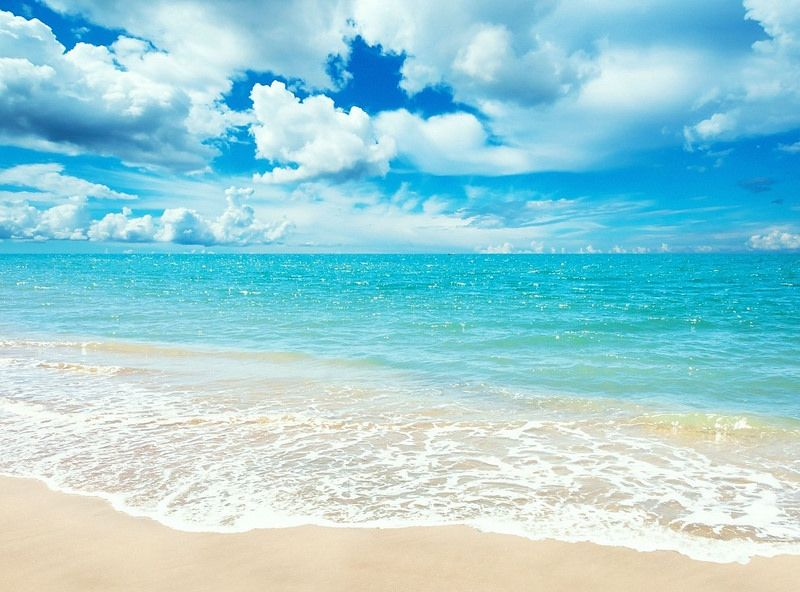

In [1]:
import cv2
import numpy as np
import urllib
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
def get_image_from_url(imgurl):
  req = urllib.request.urlopen(imgurl)
  arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
  return cv2.imdecode(arr, -1) 

# Read data
img_raw = get_image_from_url('https://raw.githubusercontent.com/xuanmse/IVP501/main/final/Ex1.jpg')
cv2_imshow(img_raw)

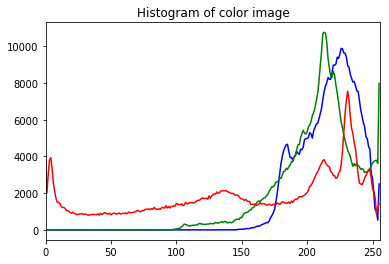

In [2]:
def display_img_histgram(img):
  # display histogram of color image
  color = ('b','g','r')
  for i,col in enumerate(color):
      histr = cv2.calcHist([img],[i],None,[256],[0,256])
      plt.plot(histr,color = col)
      plt.xlim([0,256])
  plt.title("Histogram of color image")
  plt.show()
display_img_histgram(img_raw)

##(b) Áp dụng cân bằng biểu đồ tần số (histogram equalization) cho ảnh gốc. Hiển thị ảnh sau khi được  cân bằng và biểu đồ tần số của nó. 

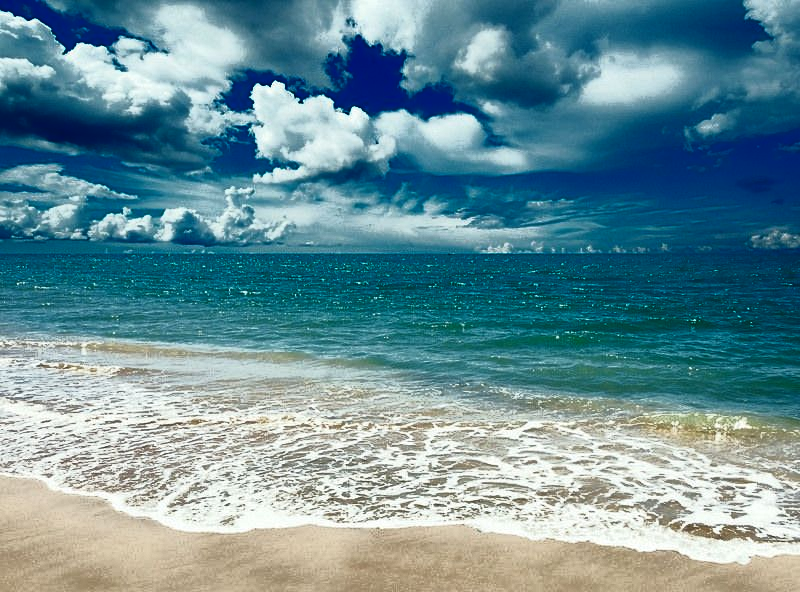

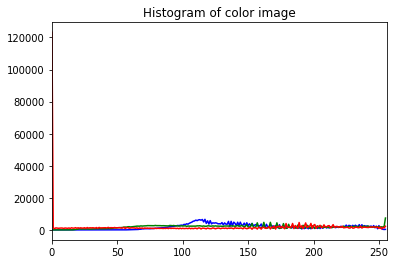

In [3]:
def run_histogram_equalization(rgb_img):
    ycrcb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2YCrCb)
    ycrcb_img[:, :, 0] = cv2.equalizeHist(ycrcb_img[:, :, 0])
    equalized_img = cv2.cvtColor(ycrcb_img, cv2.COLOR_YCrCb2BGR)
    return equalized_img

equalized_img = run_histogram_equalization(img_raw)
cv2_imshow( equalized_img)
display_img_histgram(equalized_img)

#Câu 2 (15 điểm) – Phát hiện Đường biên (Edge Detection)  
Cho ảnh màu JPG tên Ex2.jpg 


## (a) Loại bỏ nhiễu khỏi ảnh gốc. Có thể áp dụng bất kỳ bộ lọc nào. 


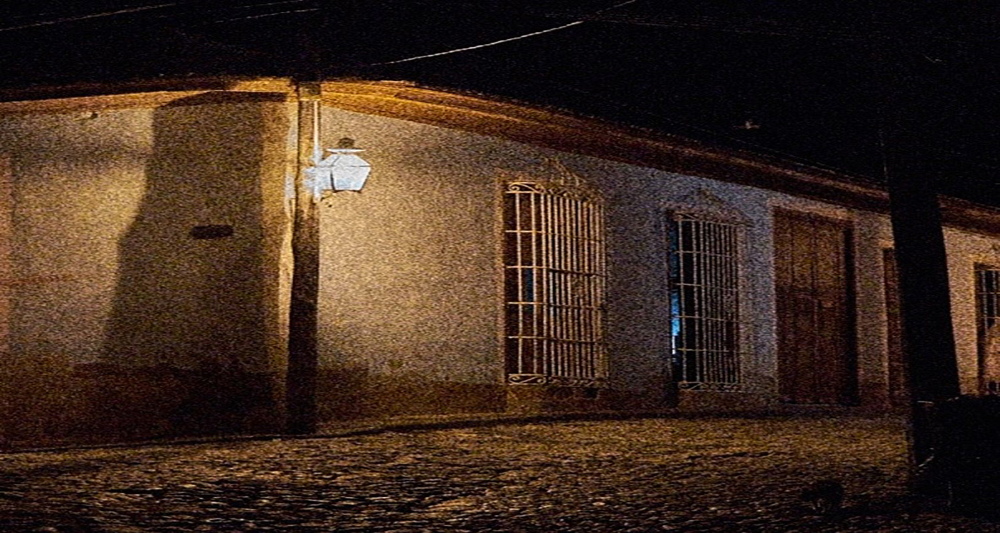

In [4]:
img_raw2 = get_image_from_url('https://raw.githubusercontent.com/xuanmse/IVP501/main/final/Ex2.jpg')
cv2_imshow(img_raw2)

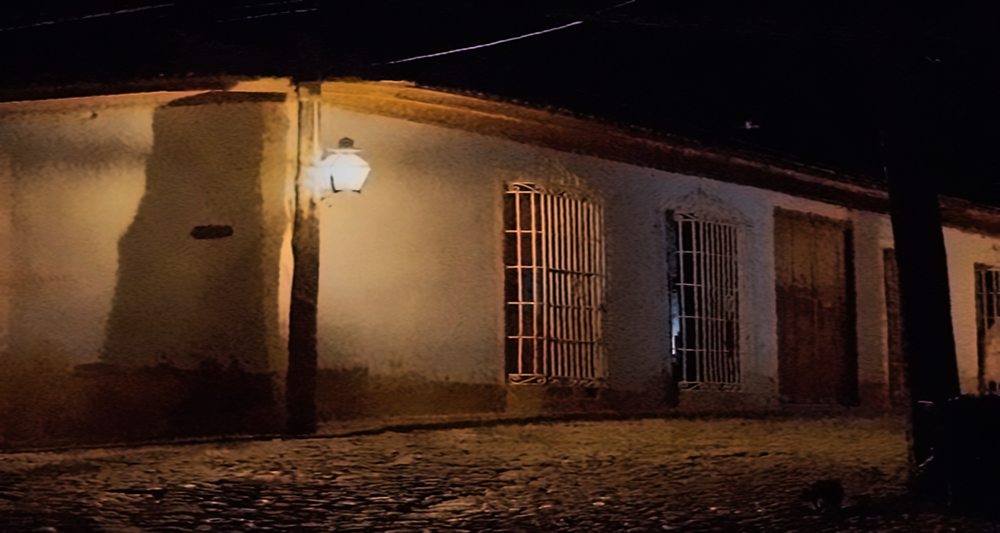

In [5]:
img_raw2_noiseless = cv2.fastNlMeansDenoisingColored(img_raw2,None,20,20,7,41) 
cv2_imshow(img_raw2_noiseless)

## (b) Áp dụng các toán tử Prewitt, Sobel và Roberts để phát hiện các cạnh. Đối với mỗi trường hợp,  hãy sử dụng ba giá trị ngưỡng khác nhau để minh họa các biến thể. 

In [6]:
# convert to gray scale image:
img_raw2_gray = cv2.cvtColor(img_raw2_noiseless, cv2.COLOR_BGR2GRAY)


### Apply the Prewitt operator:

In [7]:
# Prewitt kernels
def edge_detect_prewitt(img,weightx,weighty ):
  kernelx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]], dtype=np.float32)
  kernely = np.array([[-1,-1,-1],[0,0,0],[1,1,1]], dtype=np.float32)

  # Apply the kernels to the grayscale image
  prewittx = cv2.filter2D(img, -1, kernelx)
  prewitty = cv2.filter2D(img, -1, kernely)

  # Combine the results
  return cv2.addWeighted(prewittx,weightx, prewitty, weighty, 0)

prewitt1 = edge_detect_prewitt(img_raw2_gray, 0.5 , 0.5)
prewitt2 =  edge_detect_prewitt(img_raw2_gray, 0.7 , 0.7)
prewitt3 = edge_detect_prewitt(img_raw2_gray, 0.2 , 0.7)


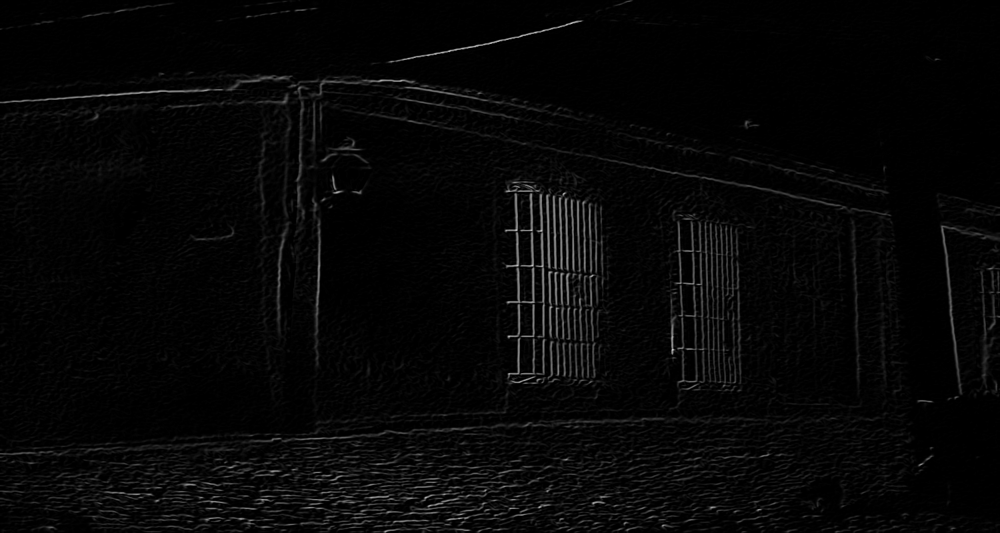

In [8]:
cv2_imshow(prewitt1)

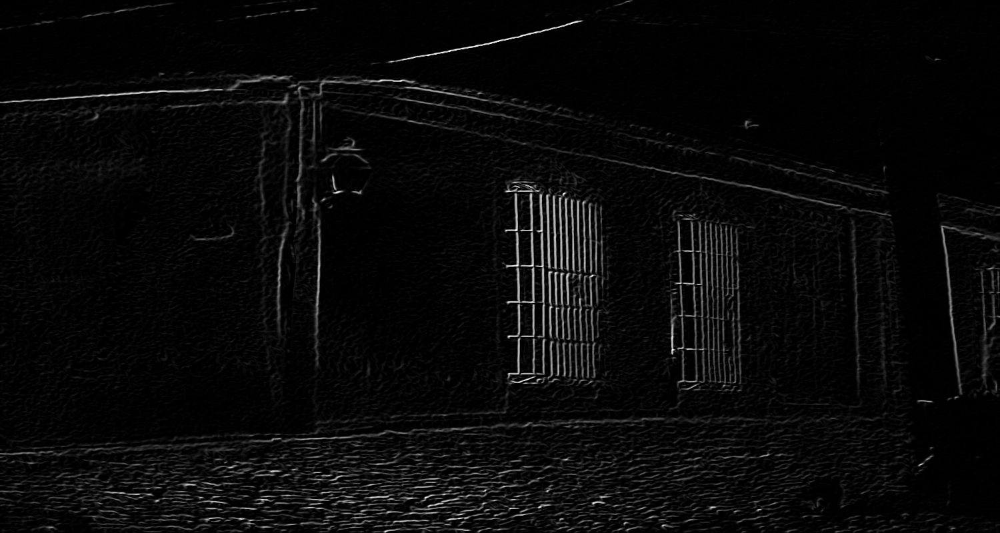

In [9]:
cv2_imshow(prewitt2)

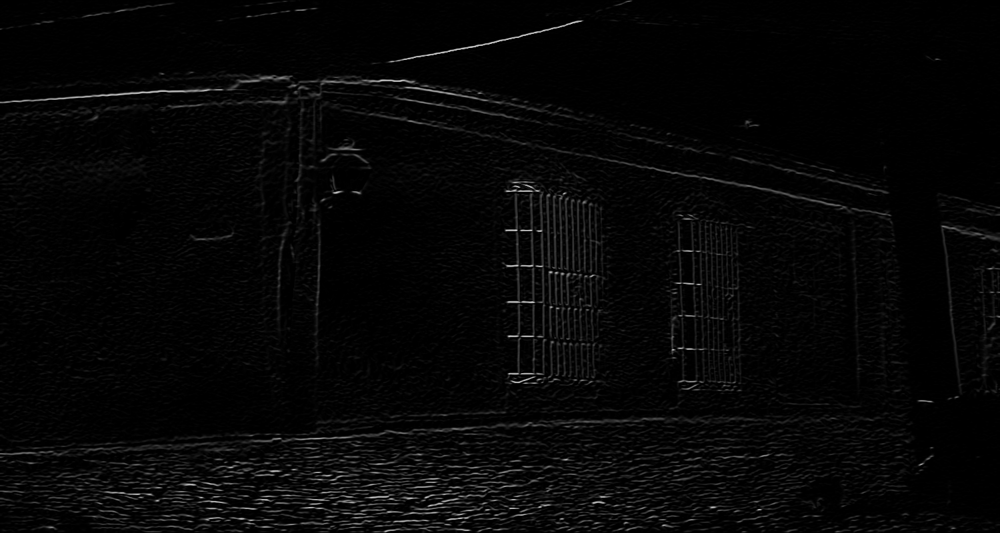

In [10]:
cv2_imshow(prewitt3)

### Apply the Sobel operator:

In [11]:
# Define the Sobel kernels
def edge_detect_sobel(img, weightx,weighty):
  kernelx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)
  kernely = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=np.float32)

  # Apply the kernels to the grayscale image
  sobelx = cv2.filter2D(img_raw2_gray, -1, kernelx)
  sobely = cv2.filter2D(img_raw2_gray, -1, kernely)

  # Combine the results
  return cv2.addWeighted(sobelx, weightx, sobely, weighty, 0)
sobel1 = edge_detect_sobel(img_raw2_gray,0.5, 0.5 )
sobel2 = edge_detect_sobel(img_raw2_gray,0.2, 0.2 )
sobel3 = edge_detect_sobel(img_raw2_gray,0.2, 0.7 )


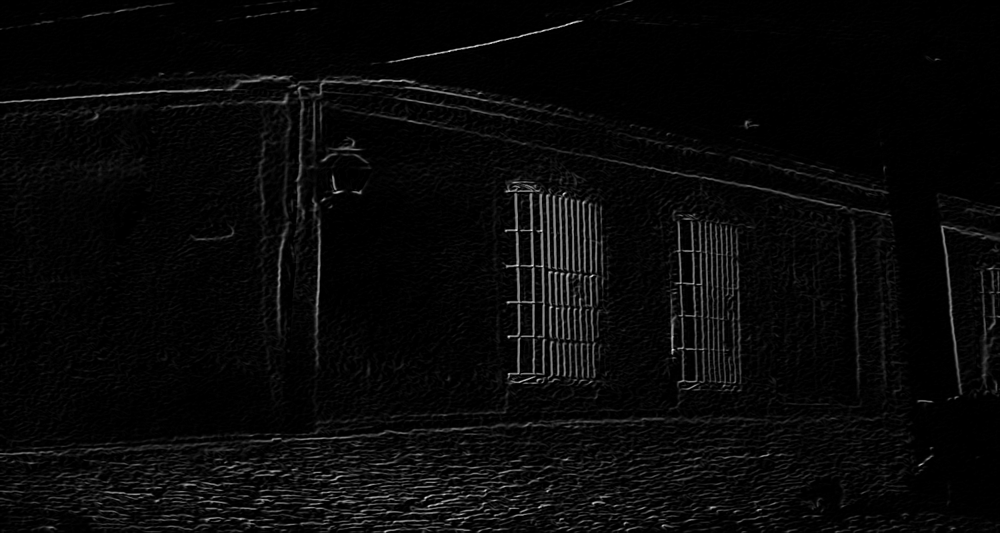

In [12]:
cv2_imshow(sobel1)

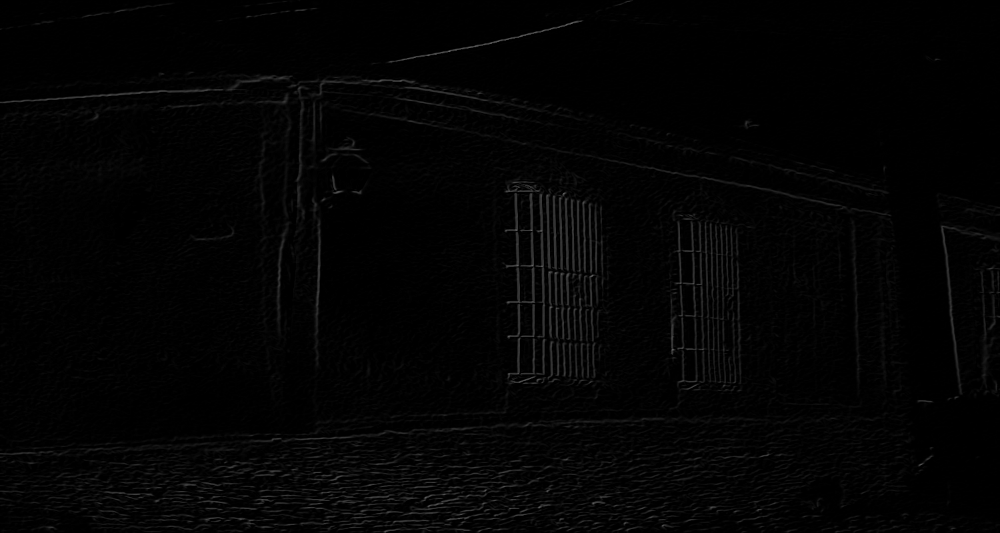

In [13]:
cv2_imshow(sobel2)

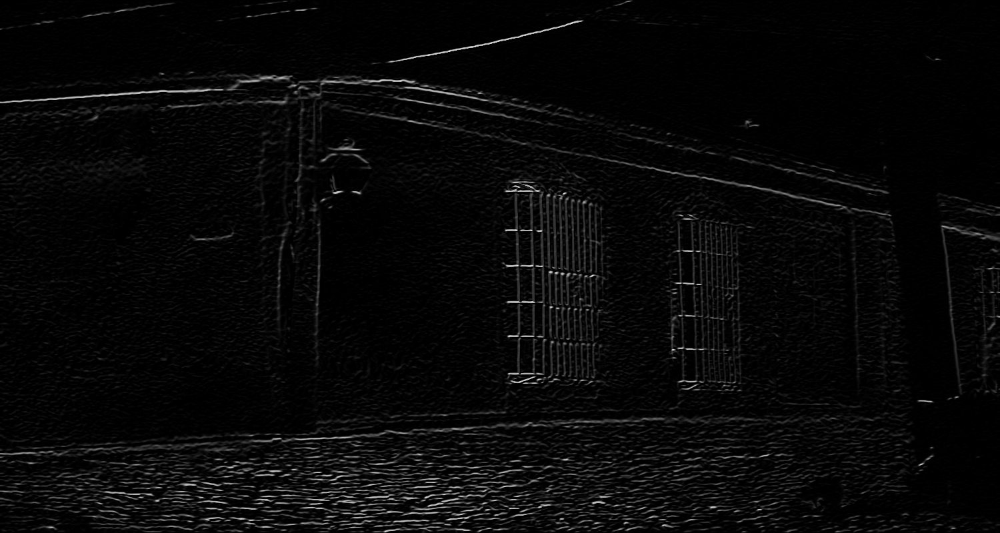

In [14]:
cv2_imshow(sobel3)

### Apply the Roberts operator:

In [15]:
def edge_detect_roberts (img,weightx,weighty ):  
  kernelx = np.array([[1,0],[0,-1]], dtype=np.float32)
  kernely = np.array([[0,1],[-1,0]], dtype=np.float32)

  # Apply the kernels to the grayscale image
  robertsx = cv2.filter2D(img_raw2_gray, -1, kernelx)
  robertsy = cv2.filter2D(img_raw2_gray, -1, kernely)

  # Combine the results
  return cv2.addWeighted(robertsx, weightx, robertsy, weighty, 0)

roberts1= edge_detect_roberts(img_raw2_gray,0.5,0.5)
roberts2= edge_detect_roberts(img_raw2_gray,0.7,0.7)
roberts3= edge_detect_roberts(img_raw2_gray,0.2,0.7)

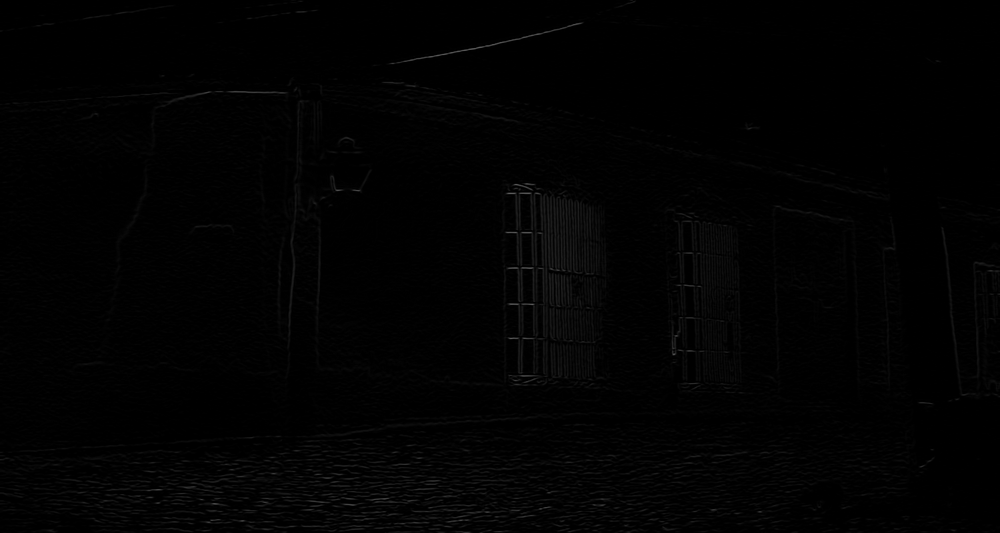

In [16]:
cv2_imshow(roberts1)

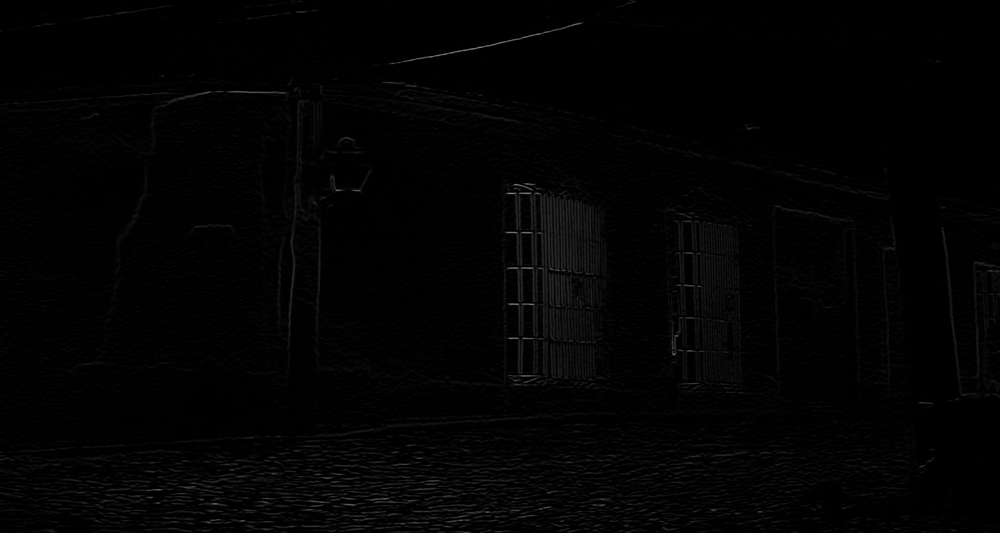

In [17]:
cv2_imshow(roberts2)

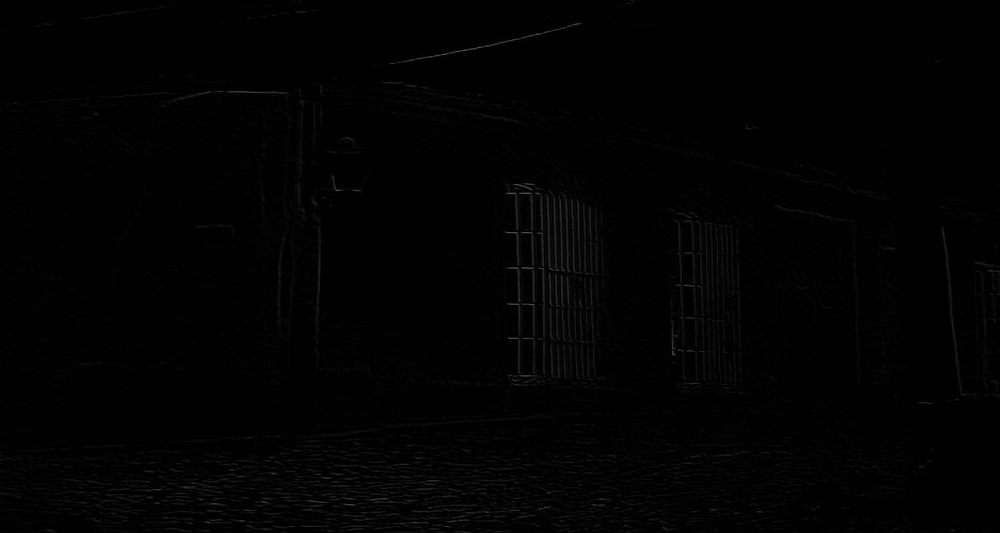

In [18]:
cv2_imshow(roberts3)

## (c) Áp dụng bộ dò cạnh Canny với ba độ lệch chuẩn khác nhau  σ = √2, 4√2 và 8√2 

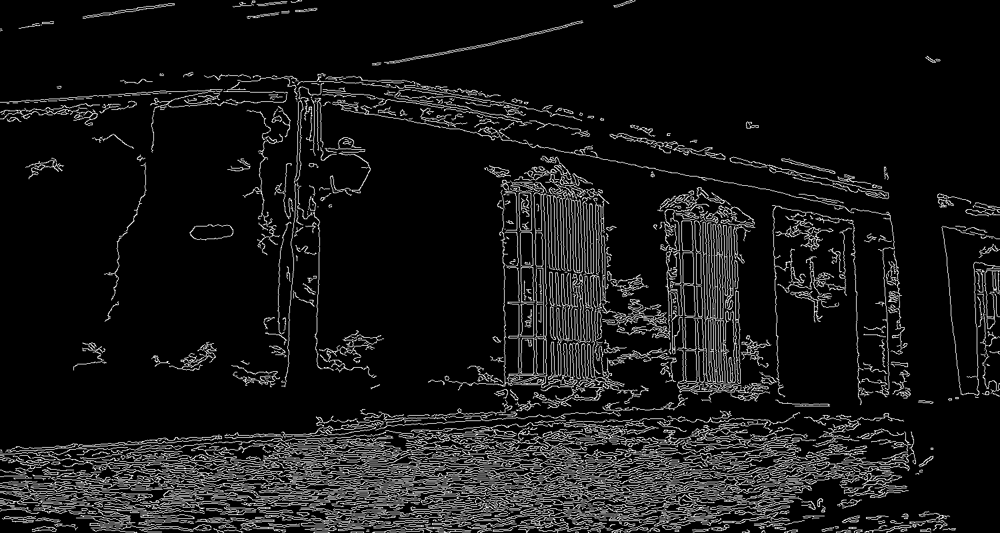

In [19]:
def edge_detect_canny(image, sigma=0.33):
	# compute the median of the single channel pixel intensities
	v = np.median(image)
	# apply automatic Canny edge detection using the computed median
	lower = int(max(0, (1.0 - sigma) * v))
	upper = int(min(255, (1.0 + sigma) * v))
	edged = cv2.Canny(image, lower, upper)
	# return the edged image
	return edged

# Canny edge detection with sigma = sqrt(2)
img2_canny_edges1 = edge_detect_canny(img_raw2_gray, sigma=1.414)
# Canny edge detection with sigma = 4*sqrt(2)
img2_canny_edges2 = edge_detect_canny(img_raw2_gray, sigma=5.656)
# Canny edge detection with sigma = 8*sqrt(2)
img2_canny_edges3 = edge_detect_canny(img_raw2_gray, sigma=11.313)


cv2_imshow(img2_canny_edges1)

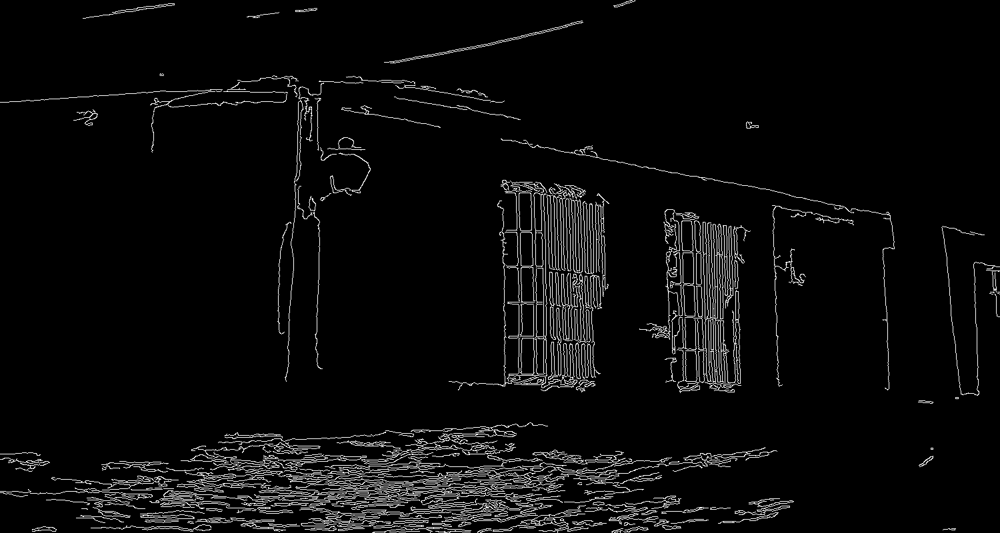

In [20]:
cv2_imshow(img2_canny_edges2)

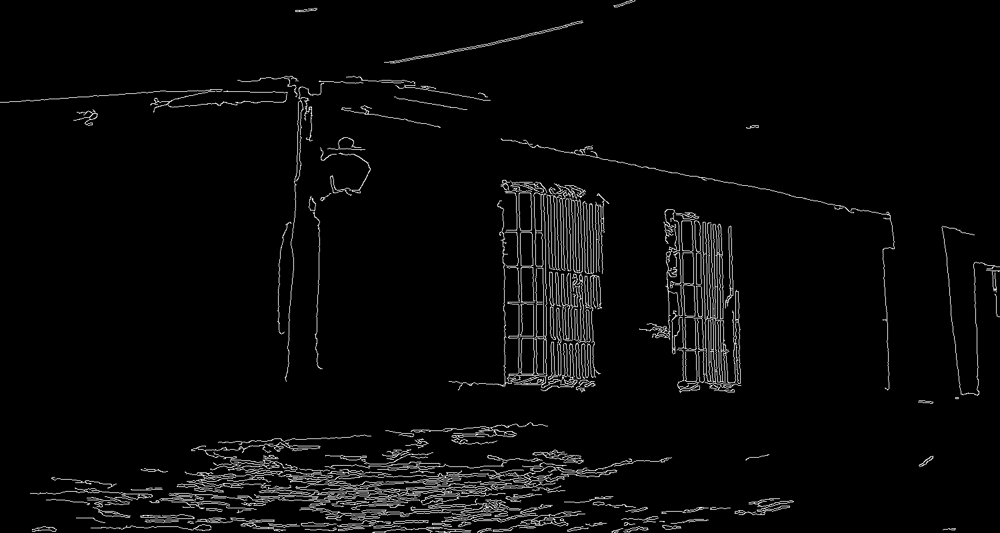

In [21]:
cv2_imshow(img2_canny_edges3)

# Câu 3. (15 điểm) - Ảnh màu (Color Image) và Ảnh nhị phân (Binary Image)
Cho ảnh màu JPG tên Ex3.jpg
Biến đổi ảnh trên thành ảnh nhị phân bằng 3 phương pháp: ngưỡng thủ công (manual thresholding),
ngưỡng toàn cục (global thresholding) và ngưỡng cục bộ (local thresholding). So sánh 3 phương
pháp và hiển thị biểu đồ tần số.

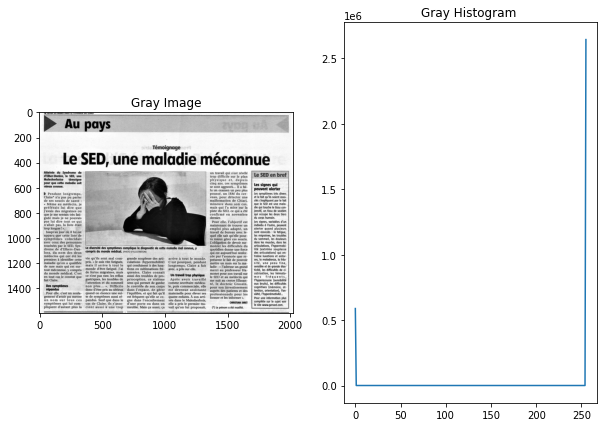

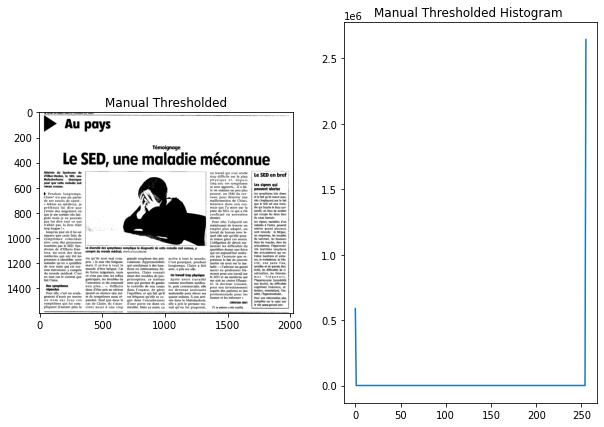

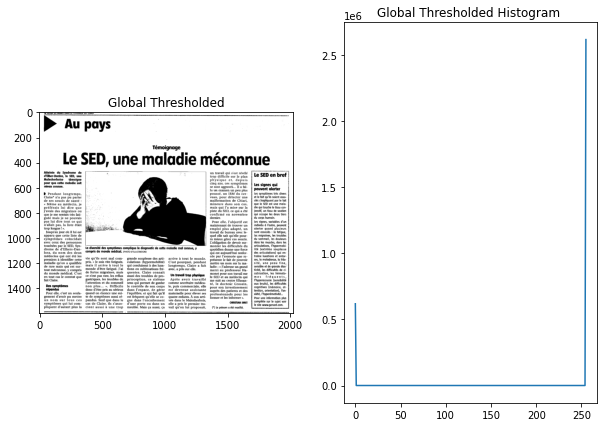

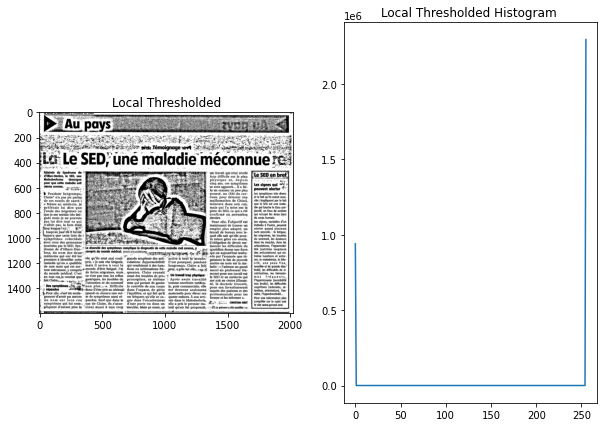

In [22]:
# load image
img_raw3 = get_image_from_url('https://raw.githubusercontent.com/xuanmse/IVP501/main/final/Ex3.jpg')
# Convert to grayscale
img_raw3_gray = cv2.cvtColor(img_raw3, cv2.COLOR_BGR2GRAY)

# Biến đổi ảnh trên thành ảnh nhị phân bằng 3 phương pháp: 
# - ngưỡng thủ công (manual thresholding)
# - ngưỡng toàn cục (global thresholding)
# - ngưỡng cục bộ (local thresholding) 
# - So sánh 3 phương pháp và hiển thị biểu đồ tần số.

gray_hist = cv2.calcHist([img_raw3_gray], [0], None, [256], [0, 256])

# Manual thresholding
manual_threshold = 100
ret_manual, img_manual = cv2.threshold(img_raw3_gray, manual_threshold, 255, cv2.THRESH_BINARY)
img_manual_hist = cv2.calcHist([img_manual], [0], None, [256], [0, 256])

# Global thresholding
ret_global, img_global = cv2.threshold(img_raw3_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
img_global_hist = cv2.calcHist([img_global], [0], None, [256], [0, 256])

# Local thresholding
block_size = 51
constant = 2
img_local = cv2.adaptiveThreshold(img_raw3_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, constant)
img_local_hist = cv2.calcHist([img_local], [0], None, [256], [0, 256])


plt.figure(figsize=(10, 7))
plt.subplot(1,2, 1), plt.imshow(img_raw3_gray, cmap='gray'), plt.title('Gray Image')
plt.subplot(1, 2, 2), plt.plot(img_manual_hist.flatten()), plt.title('Gray Histogram ')

plt.figure(figsize=(10, 7))
plt.subplot(1, 2, 1), plt.imshow(img_manual, cmap='gray'), plt.title('Manual Thresholded')
plt.subplot(1, 2, 2), plt.plot(img_manual_hist.flatten()), plt.title('Manual Thresholded Histogram ')

plt.figure(figsize=(10, 7))
plt.subplot(1, 2, 1), plt.imshow(img_global, cmap='gray'), plt.title('Global Thresholded')
plt.subplot(1, 2, 2), plt.plot(img_global_hist.flatten()), plt.title('Global Thresholded Histogram ')

plt.figure(figsize=(10, 7))
plt.subplot(1, 2, 1), plt.imshow(img_local, cmap='gray'), plt.title('Local Thresholded')
plt.subplot(1, 2, 2), plt.plot(img_local_hist.flatten()), plt.title('Local Thresholded Histogram ')

plt.show()

# Câu 4: (10 điểm) – Phát hiện Vật thể (Object Detection) và Đánh dấu (Region Labelling)  Cho ảnh nhị phân JPG tên Ex4.jpg 
Đổi màu các vật thể trong ảnh như sau: hình tròn (màu hồng), hình tam giác (màu tím), hình chữ nhật (màu cam), hình vuông (màu nâu). Hiển thị ảnh sau khi chỉnh. 


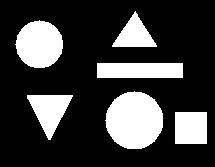

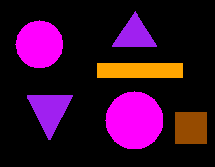

In [23]:
img_raw4 = get_image_from_url('https://raw.githubusercontent.com/xuanmse/IVP501/main/final/Ex4.jpg')
cv2_imshow(img_raw4)
# Binarize image
level, img_bw = cv2.threshold(img_raw4, 60, 255, cv2.THRESH_BINARY)

# Label regions in the image
num_labels, L = cv2.connectedComponents(img_bw)
rgb_label = np.zeros((img_bw.shape[0], img_bw.shape[1], 3), dtype=np.uint8)
# rgbLabel = img_raw4.copy()

rgb_label[L == 1] = [240, 32, 160] # Blue -> Pentagon
rgb_label[L == 5] = [240, 32, 160] # Blue -> Pentagon
rgb_label[L == 2] = [255, 0, 255] # Magenta -> Circle
rgb_label[L == 4] = [255, 0, 255] # Magenta -> Circle
rgb_label[L == 3] = [0, 165, 255] # Orange -> Rectangle
rgb_label[L == 6] = [0, 75, 150] # Cyan -> Star

# Save images
cv2_imshow(rgb_label)



# Câu 5 (15 điểm) – Điểm góc (Keypoint Detection)
Cho ảnh màu JPG tên Ex5.jpg
Trong cả hai trường hợp, sử dụng bộ lọc Sobel.

 ## (a) Sử dụng bộ phát hiện Harris hiển thị 400 điểm góc mạnh nhất của ảnh gốc.

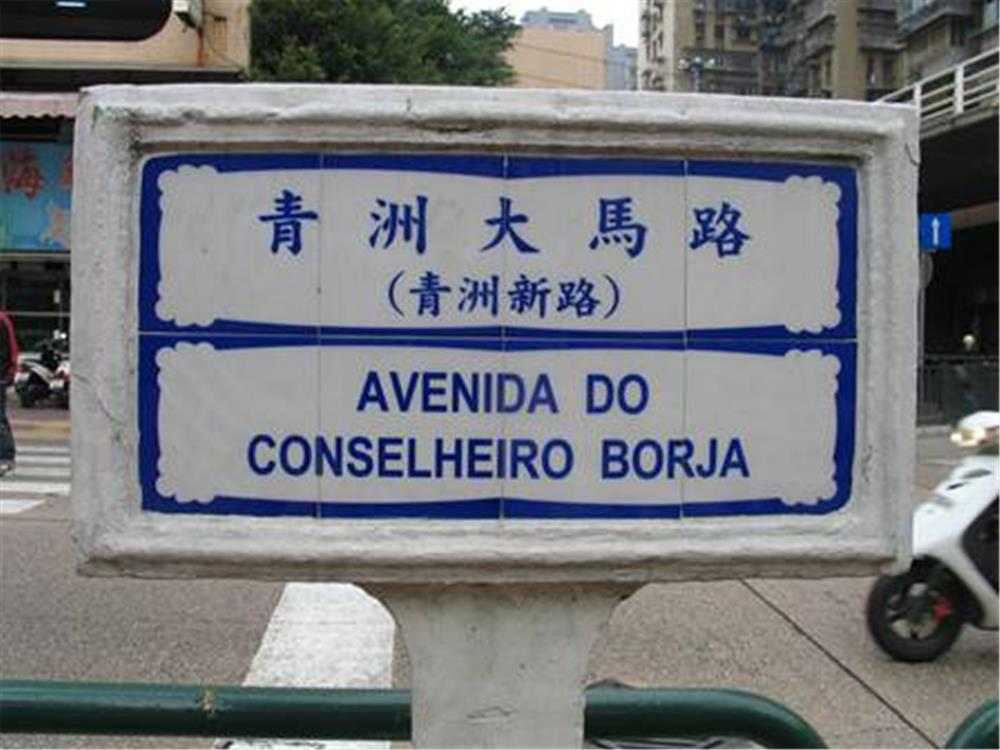

In [24]:
img_raw5 = get_image_from_url('https://raw.githubusercontent.com/xuanmse/IVP501/main/final/Ex5.jpg')
cv2_imshow(img_raw5)

### Cách 1:

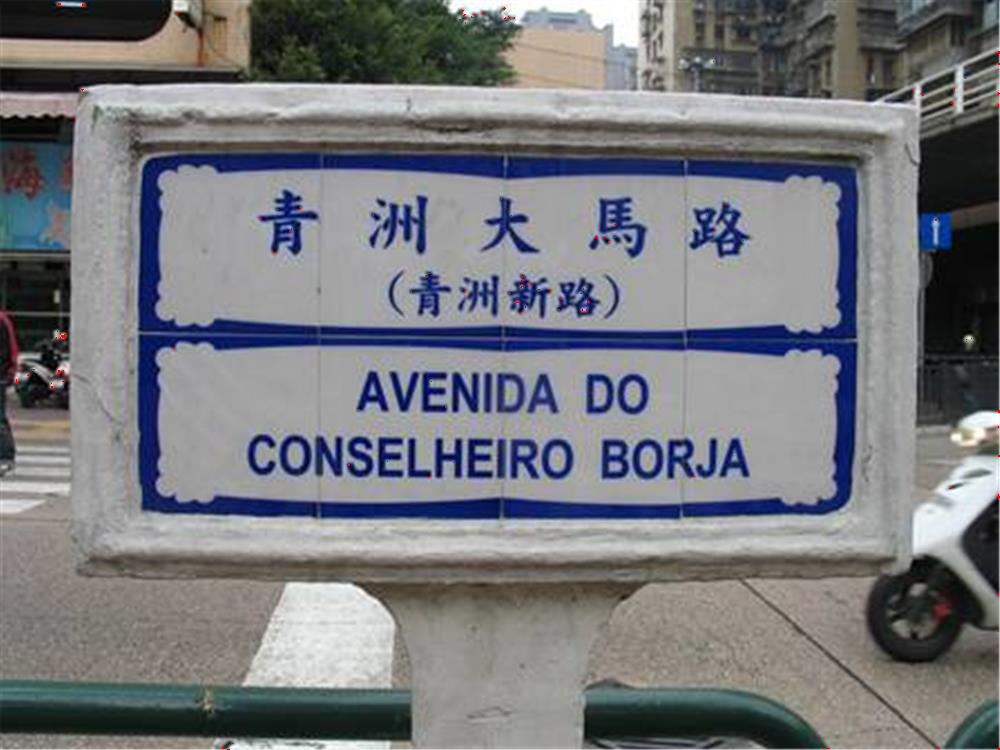

In [25]:

  
# convert the input image into
# grayscale color space
image= img_raw5.copy()
operatedImage = cv2.cvtColor(img_raw5, cv2.COLOR_BGR2GRAY)
  
operatedImage = np.float32(operatedImage)
  
dest = cv2.cornerHarris(operatedImage, 2, 3, 0.04)

# dest = cv2.dilate(dest, None)
indices = np.argsort(dest, axis=None)[-400:]
mask = np.zeros_like(dest, dtype=bool)
mask[np.unravel_index(indices, dest.shape)] = True

image[mask]=[0, 0, 255]

# the window showing output image with corners
cv2_imshow( image)

### Cách 2:

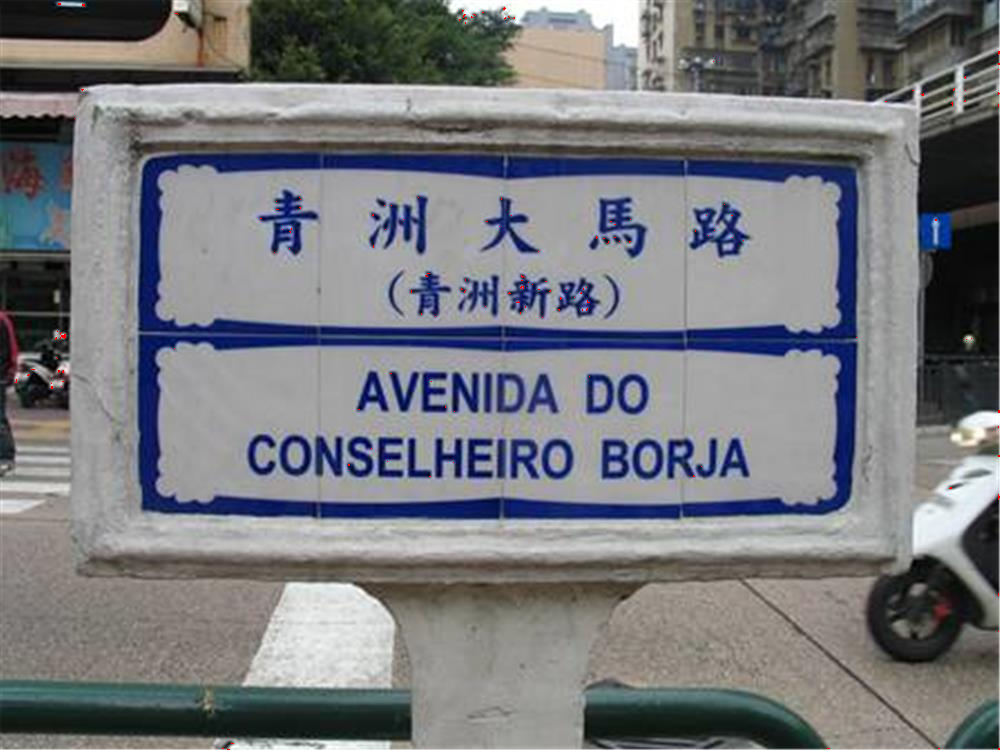

In [26]:
img = img_raw5.copy()

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray,2,3,0.04)

top = np.sort(dst.flatten())[-400]
img[dst>top]=[0,0,255]

cv2_imshow(img)

## (b) Sử dụng bộ phát hiện Hessian hiển thị 300 điểm góc mạnh nhất của ảnh gốc.
